![AddictivePtyhon](AddictivePython.png)

### Loading all necessary Packages/Libraries

In [2]:
# Loading the iconic trio 🔥
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
plt.style.use('fivethirtyeight')

# Importing model_selection to get access to some dope functions like GridSearchCV()
from sklearn import model_selection

# Loading models
from sklearn import linear_model
from sklearn import svm
from sklearn import tree
from sklearn import ensemble
from sklearn import neighbors

# custom
import helper

# Loading black for formatting codes
%load_ext blackcellmagic

The blackcellmagic extension is already loaded. To reload it, use:
  %reload_ext blackcellmagic


### Checking versions of packages

In [3]:
import sklearn
import matplotlib

# Checking the version of sklearn
print(f'You are using sklearn version: {sklearn.__version__}')

# Checking the version of pandas
print(f'You are using pandas version: {pd.__version__}')

# Checking the version of numpy
print(f'You are using numpy version: {np.__version__}')

# Checking the version of matplotlib
print(f'You are using matplotlib version: {matplotlib.__version__}')

# Checking the version of seaborn
print(f'You are using seaborn version: {sns.__version__}')

You are using sklearn version: 0.23.2
You are using pandas version: 1.1.2
You are using numpy version: 1.19.2
You are using matplotlib version: 3.3.2
You are using seaborn version: 0.10.1


### Styling Tables

In [4]:
%%HTML
<style type='text/css'>
table.dataframe th, table.dataframe td{
    border: 3px solid purple !important;
    color: solid black !important;
}
</style>

### Loading the Dataset

In [5]:
# Loading dataset
filepath = "data/Clean_Akosombo_data.csv"
akosombo = helper.load_csv_data(filepath)

Successfully loaded!


### Splitting the Dataset

In [6]:
# Splitting dataset
target_variable = "generation"
X, y, X_train, X_test, y_train, y_test = helper.split_data(akosombo, target_variable)

Data is splitted into X, y, X_train, X_test, y_train, y_test.

Shape Info of Features Training Set:
Number of datapoints (rows): 10001
Number of features (columns): 2

Shape Info of Features Test Set:
Number of datapoints (rows): 2501
Number of features (columns): 2


### Scaling the Dataset

In [7]:
# Data Scaling
X_train, X_test = helper.scale(X_train, X_test)

### Chosing Baseline Models and Training Models

In [8]:
# Instantiating baseline models
models = [
    ("Linear Regression", linear_model.LinearRegression()),
    ("Ridge", linear_model.Ridge()),
    ("SVR", svm.LinearSVR()),
    ("NuSVR", svm.NuSVR()),
    ("SVR", svm.SVR()),
    ("Decision Tree", tree.DecisionTreeRegressor()),
    ("Random Forest", ensemble.RandomForestRegressor()),
    ("AdaBoost", ensemble.AdaBoostRegressor()),
    ("ExtraTree", ensemble.ExtraTreesRegressor()),
    ("GradientBoosting", ensemble.GradientBoostingRegressor()),
    ("K Neighbors", neighbors.KNeighborsRegressor()),
]

# Instantiating model_names as an empty list to keep the names of the models
model_names = []

# Instantiating accuracies as an empty list to keep the accuracy scores of the models
accuracies = []

# Fitting models to Training Dataset and Scoring them on Test set
for dataset_name, dataset in [("Akosomba_Data", akosombo)]:
    for model_name, model in models:
        regressor_model = model
        regressor_model.fit(X_train, y_train)

        accuracy = regressor_model.score(X_test, y_test)
        print(dataset_name, model_name, accuracy)

        model_names.append(model_name)
        accuracies.append(accuracy)

Akosomba_Data Linear Regression 0.969749426931279
Akosomba_Data Ridge 0.9697837468881153
Akosomba_Data SVR 0.9696598143720885
Akosomba_Data NuSVR 0.9761908456257131
Akosomba_Data SVR 0.9762842898104876
Akosomba_Data Decision Tree 0.9626355308473704
Akosomba_Data Random Forest 0.9761726555663192
Akosomba_Data AdaBoost 0.955374120915371
Akosomba_Data ExtraTree 0.9755318467807872
Akosomba_Data GradientBoosting 0.9772234044519423
Akosomba_Data K Neighbors 0.9742917147982414


### Visualizing Models' Accuracy with Bar Charts

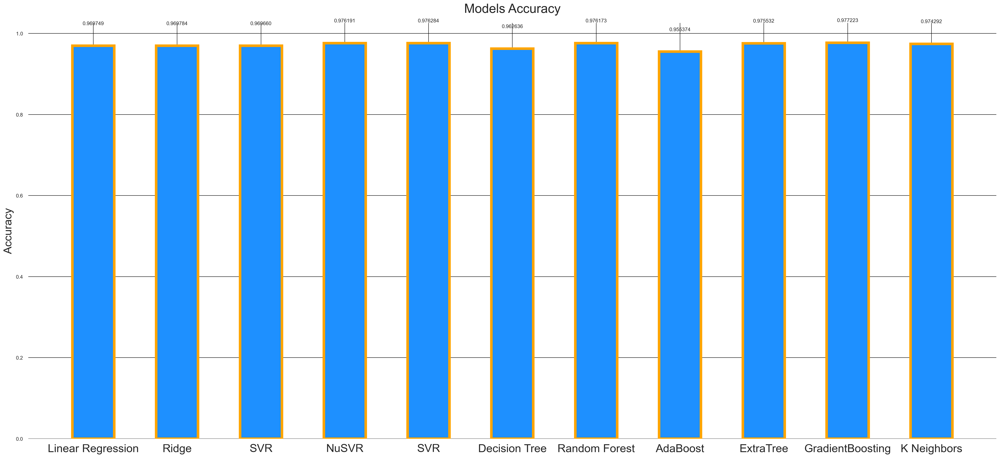

In [9]:
# Size in inches (width, height) & resolution(DPI)
plt.figure(figsize=(34, 15), dpi=200)

# The x locations for the groups
x_loc = np.arange(len(models))  

# Bar width
width = 0.5  

# Plotting the graphs with bar chart
models_graph = plt.bar(
    x_loc, accuracies, width, color="dodgerblue", edgecolor="orange", linewidth=5,
)

# Setting graph's title
plt.title("Models Accuracy", fontsize=25, pad=20)

# Setting xticks
plt.xticks(x_loc, model_names, fontsize=22)

# Setting xticks
plt.ylabel("Accuracy", fontsize=22)

# Customising the grid of the graph
plt.grid(b=True, which="both", axis="both", color="black", linewidth=0.8)

# Creating a function to add models' accuracy score on top of each bar plot
def addLabel(models):
    for model in models:
        height = model.get_height()
        plt.text(
            model.get_x() + model.get_width() / 2.0,
            1.05 * height,
            "%f" % height,
            ha="center",
            va="bottom",
        )

# Calling function to add model's accuracy score on top of each bar plot
addLabel(models_graph)

# Saving the plot as a png file
plt.savefig('Bar_Charts_of_Models_and_their_Accuracy.png', dpi=300, transparent=True)

# Showing the plot
plt.show()

### Evaluating Models


Linear Regression Mean Squared Error: 0.14625233556901107
Linear Regression Root Mean Squared Error: 0.3824295171257196
Linear Regression R2 Score: 0.969749426931279
Linear Regression Explained Variance Score: 0.969772234576705
Linear Regression Mean Absolute Error: 0.29263695465956624
Linear Regression Meadian Abosulute Error: 0.26777899347990264
Linear Regression Mean Squared Log Error: 0.0007141004739016015


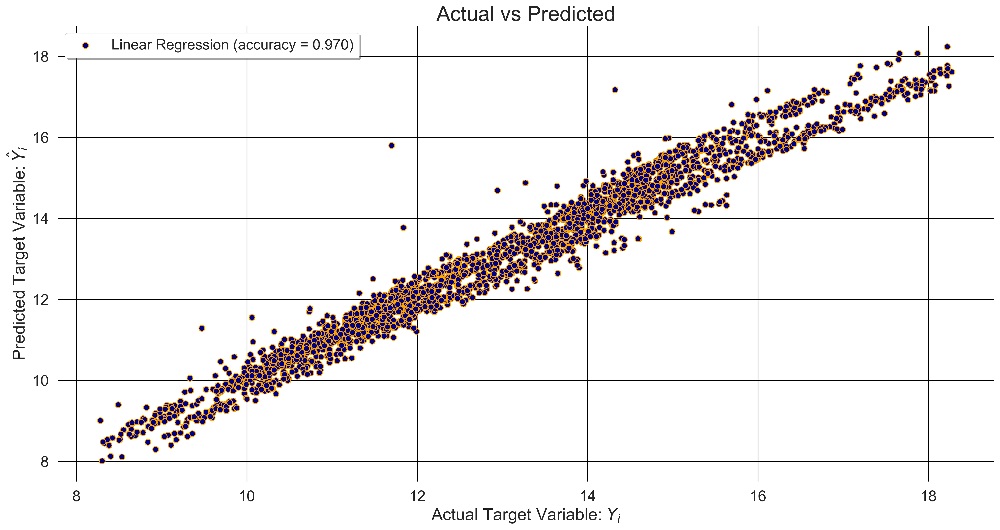


Ridge Mean Squared Error: 0.14608640899854483
Ridge Root Mean Squared Error: 0.3822125181081133
Ridge R2 Score: 0.9697837468881153
Ridge Explained Variance Score: 0.9698066436041364
Ridge Mean Absolute Error: 0.29262933355194237
Ridge Meadian Abosulute Error: 0.2656697271872801
Ridge Mean Squared Log Error: 0.0007123218460580993


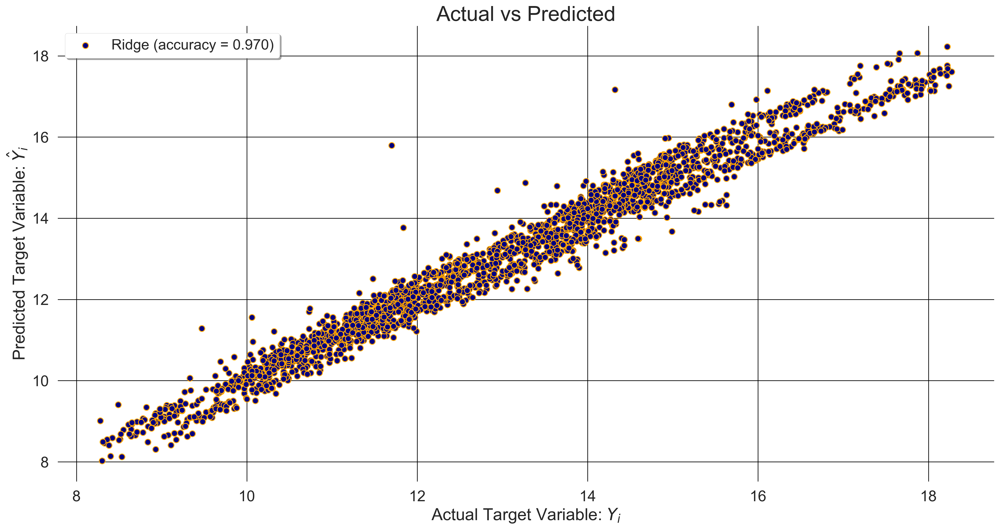


SVR Mean Squared Error: 0.14668558508293478
SVR Root Mean Squared Error: 0.38299554185778034
SVR R2 Score: 0.9696598143720885
SVR Explained Variance Score: 0.969667139280364
SVR Mean Absolute Error: 0.2911342314809513
SVR Meadian Abosulute Error: 0.2625092758230956
SVR Mean Squared Log Error: 0.0007128579323998808


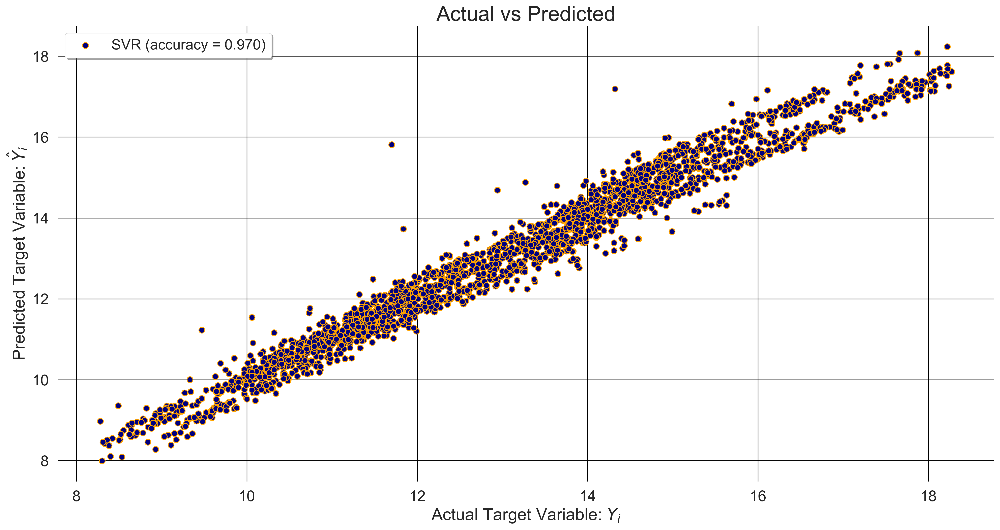


NuSVR Mean Squared Error: 0.1151100320397934
NuSVR Root Mean Squared Error: 0.3392786937604444
NuSVR R2 Score: 0.9761908456257131
NuSVR Explained Variance Score: 0.9761920945378169
NuSVR Mean Absolute Error: 0.24964070901547153
NuSVR Meadian Abosulute Error: 0.1964009749299347
NuSVR Mean Squared Log Error: 0.000575800094914912


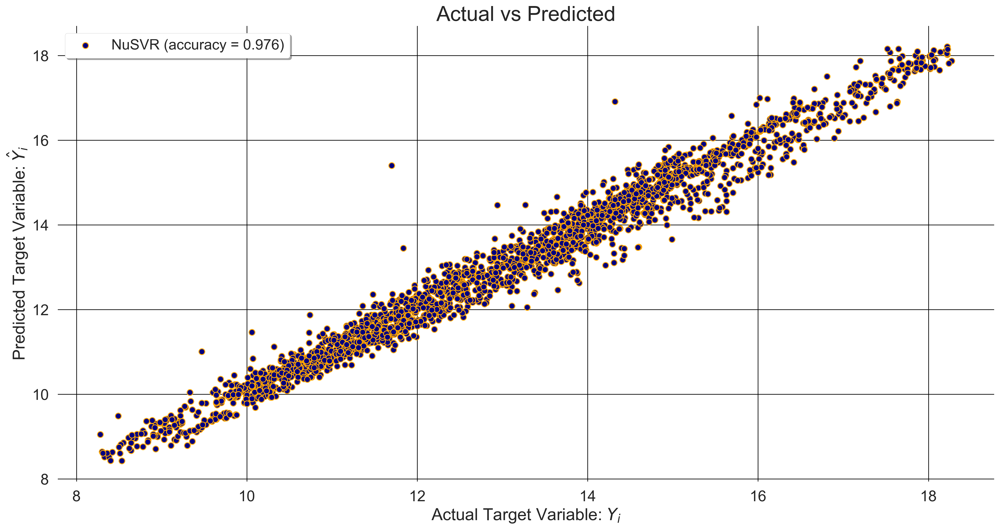


SVR Mean Squared Error: 0.1146582577795977
SVR Root Mean Squared Error: 0.338612252849181
SVR R2 Score: 0.9762842898104876
SVR Explained Variance Score: 0.9762930859445609
SVR Mean Absolute Error: 0.2442590031041782
SVR Meadian Abosulute Error: 0.18377625009494558
SVR Mean Squared Log Error: 0.000572986557719098


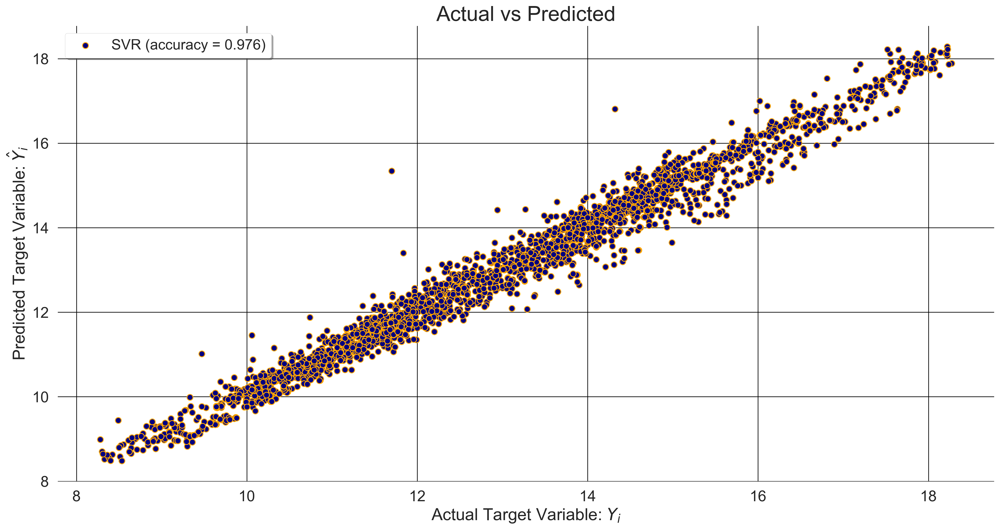


Decision Tree Mean Squared Error: 0.1806458630867649
Decision Tree Root Mean Squared Error: 0.42502454409923773
Decision Tree R2 Score: 0.9626355308473704
Decision Tree Explained Variance Score: 0.9627170611190596
Decision Tree Mean Absolute Error: 0.27925213914434166
Decision Tree Meadian Abosulute Error: 0.1599999999999362
Decision Tree Mean Squared Log Error: 0.0008918054348536952


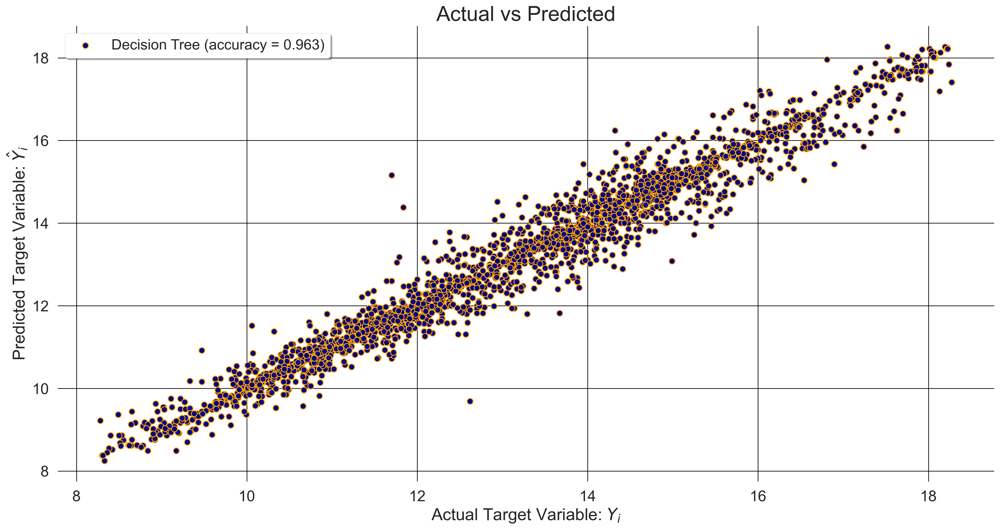


Random Forest Mean Squared Error: 0.11519797545377308
Random Forest Root Mean Squared Error: 0.33940827251817696
Random Forest R2 Score: 0.9761726555663192
Random Forest Explained Variance Score: 0.9761993954855515
Random Forest Mean Absolute Error: 0.23135515160602454
Random Forest Meadian Abosulute Error: 0.15582000000000917
Random Forest Mean Squared Log Error: 0.0005683002076942498


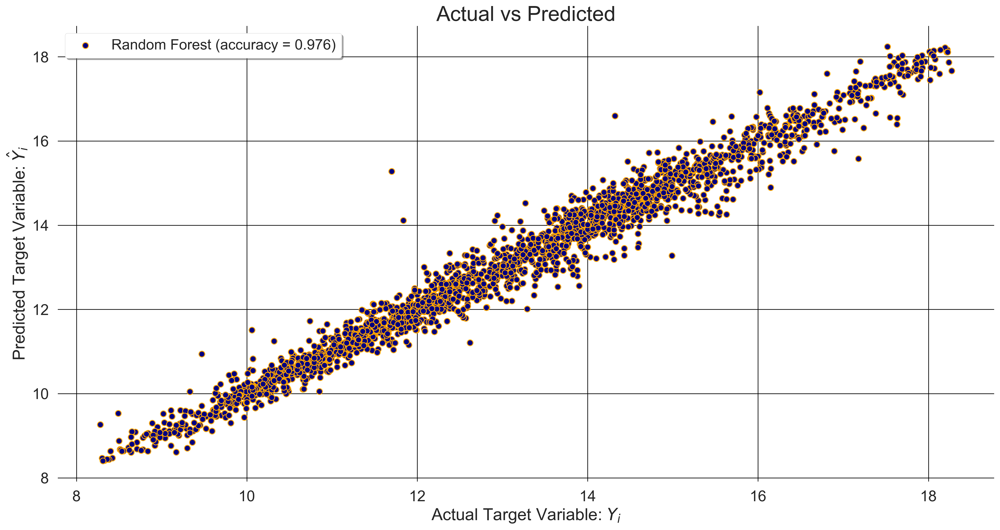


AdaBoost Mean Squared Error: 0.21575257526925323
AdaBoost Root Mean Squared Error: 0.4644917386447828
AdaBoost R2 Score: 0.955374120915371
AdaBoost Explained Variance Score: 0.9554244087957198
AdaBoost Mean Absolute Error: 0.3668602810755813
AdaBoost Meadian Abosulute Error: 0.3129934296977215
AdaBoost Mean Squared Log Error: 0.001160651515737672


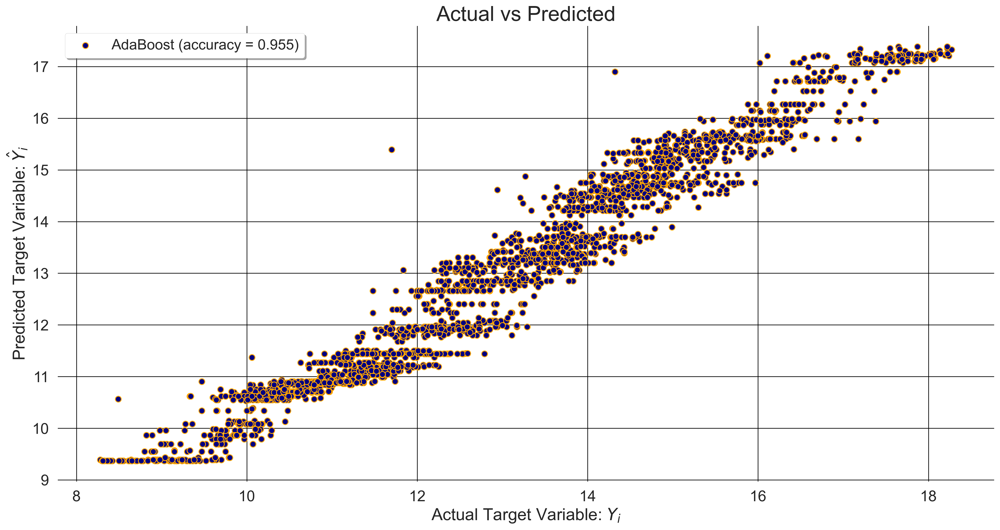


ExtraTree Mean Squared Error: 0.1182960913580334
ExtraTree Root Mean Squared Error: 0.3439419883614581
ExtraTree R2 Score: 0.9755318467807872
ExtraTree Explained Variance Score: 0.9755598043192657
ExtraTree Mean Absolute Error: 0.23083260015993706
ExtraTree Meadian Abosulute Error: 0.15479999999999983
ExtraTree Mean Squared Log Error: 0.0005864930282266233


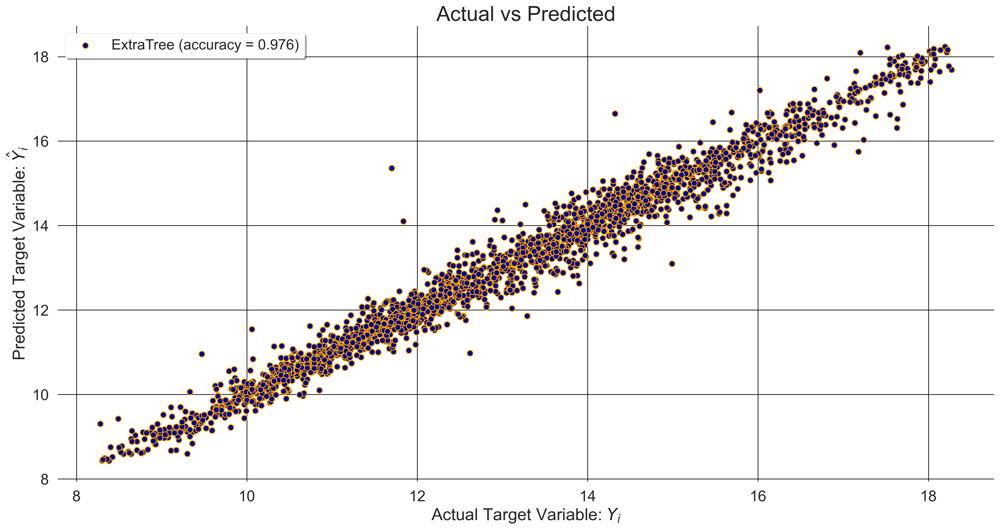


GradientBoosting Mean Squared Error: 0.11011792363889299
GradientBoosting Root Mean Squared Error: 0.3318402079900701
GradientBoosting R2 Score: 0.9772234044519423
GradientBoosting Explained Variance Score: 0.9772262384355532
GradientBoosting Mean Absolute Error: 0.2421004097809286
GradientBoosting Meadian Abosulute Error: 0.18397069087037643
GradientBoosting Mean Squared Log Error: 0.0005519263607088787


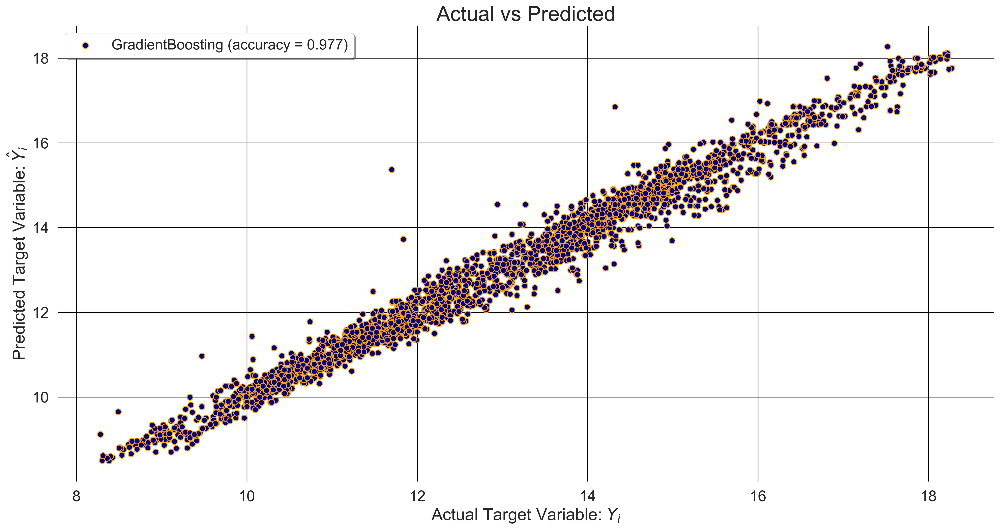


K Neighbors Mean Squared Error: 0.1242917529426631
K Neighbors Root Mean Squared Error: 0.3525503551872599
K Neighbors R2 Score: 0.9742917147982414
K Neighbors Explained Variance Score: 0.9743001723319055
K Neighbors Mean Absolute Error: 0.25122119152339034
K Neighbors Meadian Abosulute Error: 0.1819999999999986
K Neighbors Mean Squared Log Error: 0.0006201934569084686


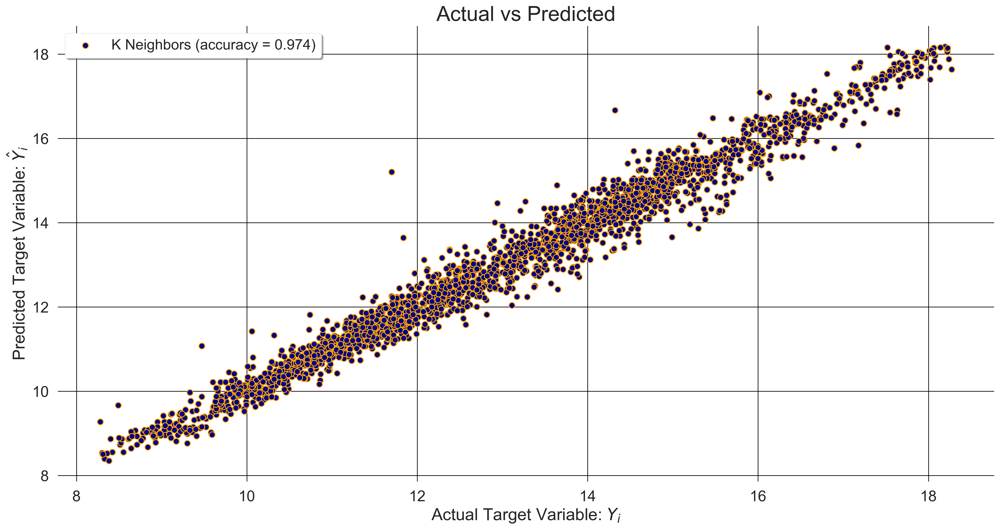

In [10]:
# Calling the custom helper function for Model Evaluation
for model_name, model in models:
    
    helper.evaluate(
        X_test, 
        y_test, 
        model_name, 
        model, 
        save=True, 
        transparent=True, 
        dpi=300, 
        figsize=(20, 10), 
        facecolor='navy', 
        edgecolor='orange')

### Cross Validating Models

#### Cross Validating with a single metric

In [11]:
# Splitting data into 10 folds
cv_kfold = model_selection.KFold(n_splits=10, shuffle=True, random_state=23)
scorer = "r2"

# Instantiating model_names as an empty list to keep the names of the models
model_names = []

# Instantiating cv_mean_scores as an empty list to keep the cross validation mean score of each model
cv_mean_scores = []

# Instantiating cv_std_scores as an empty list to keep the cross validation standard deviation score of each model
cv_std_scores = []

# Looping through the baseline models and cross validating each model
for model_name, model in models:
    regressor_model = model
    model_scores = model_selection.cross_val_score(
        regressor_model, X, y, cv=cv_kfold, scoring=scorer, n_jobs=-1, verbose=1,
    )
    
    print(
        f"{model_name} Accuracy: %0.2f (+/- %0.2f)"
        % (model_scores.mean(), model_scores.std() * 2)
    )

    # Appending model names to model_name
    model_names.append(model_name)
    
    # Appending cross validation mean score of each model to cv_mean_score
    cv_mean_scores.append(model_scores.mean())
    
    # Appending cross validation standard deviation score of each model to cv_std_score
    cv_std_scores.append(model_scores.std())

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    3.0s remaining:    2.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Linear Regression Accuracy: 0.97 (+/- 0.00)
Ridge Accuracy: 0.97 (+/- 0.00)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    2.1s remaining:    1.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    2.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


SVR Accuracy: 0.83 (+/- 0.37)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:   10.1s remaining:    6.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   14.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


NuSVR Accuracy: 0.93 (+/- 0.00)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:   10.6s remaining:    7.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   15.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.1s finished


SVR Accuracy: 0.94 (+/- 0.00)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Decision Tree Accuracy: 0.96 (+/- 0.01)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    4.1s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Random Forest Accuracy: 0.98 (+/- 0.00)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.8s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    1.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


AdaBoost Accuracy: 0.95 (+/- 0.00)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    3.4s remaining:    2.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


ExtraTree Accuracy: 0.98 (+/- 0.00)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    1.1s remaining:    0.7s


GradientBoosting Accuracy: 0.98 (+/- 0.00)
K Neighbors Accuracy: 0.98 (+/- 0.00)


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


In [12]:
# Parsing model_names, cv_mean_scores and cv_std_scores and a pandas DataFrame object
cv_results = pd.DataFrame({"model_name": model_names, "mean_score": cv_mean_scores, "std_score": cv_std_scores})

# Sorting the Dataframe in descending order
cv_results.sort_values("mean_score", ascending=False, inplace=True,)

# Saving the DataFrame as a csv file
cv_results.to_csv("cross_validation_results.csv", index=True)

# Showing the final results
cv_results

,model_name,mean_score,std_score
6,Random Forest,0.978186,0.001380
9,GradientBoosting,0.978038,0.001226
8,ExtraTree,0.977267,0.001367
10,K Neighbors,0.975400,0.001267
1,Ridge,0.971263,0.001156
0,Linear Regression,0.971263,0.001156
5,Decision Tree,0.964648,0.002934
7,AdaBoost,0.954185,0.002251
4,SVR,0.941600,0.001811
3,NuSVR,0.934291,0.002104


### Visualizing Cross Validated Models with Bar Charts

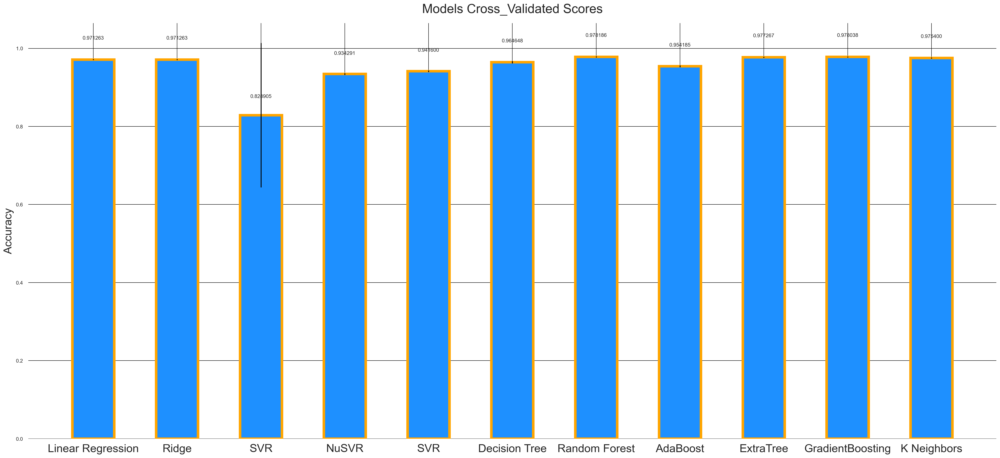

In [13]:
# Size in inches (width, height) & resolution(DPI)
plt.figure(figsize=(34, 15), dpi=200)

# The x locations for the groups
x_loc = np.arange(len(models))

# Width of each bar plot
width = 0.5

# Plotting the graphs with bar chart
models_graph = plt.bar(
    x_loc, cv_mean_scores, width, yerr=cv_std_scores, color="dodgerblue", edgecolor="orange", linewidth=5
)

# Setting graph's title
plt.title("Models Cross_Validated Scores", fontsize=25, pad=20)

# Setting graph's xticks
plt.xticks(x_loc, model_names, fontsize=22)

# Setting graph's yticks
plt.ylabel("Accuracy", fontsize=22)

# Customising the grid of the graph
plt.grid(b=True, which="both", axis="both", color="black", linewidth=0.8)

# Calling function to add model's accuracy score on top of each bar plot
addLabel(models_graph)

# Saving plot as a png file
plt.savefig('Bar_Charts_of_Cross_Validated_Models_and_their_Accuracy.png', dpi=300, transparent=True)

# Showing plot
plt.show()

### Training the Model with the Highest Score with Default Hyperparameters

In [14]:
# Instantiating model object
high_score_model = ensemble.GradientBoostingRegressor()

# Fitting the model on Train set
high_score_model.fit(X_train, y_train)

# Scoring the model on Test set
high_score_model_accuracy = high_score_model.score(X_test, y_test)

print(
    f"Model without tuned hyperparameters has an accuracy of {high_score_model_accuracy}"
)

Model without tuned hyperparameters has an accuracy of 0.9772234044519423


### Predicting with the Trained Model and Saving Predicted Results as `csv`

In [15]:
y_pred = high_score_model.predict(X_test)

data = pd.DataFrame({"generation": list(y_test), "predicted_generation": list(y_pred),})
data.to_csv("model_predicted_values.csv", index=True)

In [16]:
data.head(10)

,generation,predicted_generation
0,17.596,17.663987
1,15.630,15.226165
2,10.850,11.354292
3,14.520,14.603583
4,8.420,8.569025
5,13.640,14.509512
6,14.010,13.864608
7,9.699,9.489637
8,13.900,12.741841
9,11.150,11.255741


### Optimizing the Hyperparameter of the Best Model with `RandomizedSearchCV`

In [17]:
# Kfold with with n_splits = 5 to split the Dataset into 5-folds
kfold = model_selection.KFold(n_splits=5, shuffle=True, random_state=23)

# Dictionary of parameters to tune with their corresponding values
parameters = {
    "loss" : ['ls', 'lad', 'huber', 'quantile'],
    "n_estimators" : [120, 500, 800, 1200], 
    "max_depth" : [15, 25, 30, None],
    "min_samples_split" : [5, 10, 15, 100],
    "min_samples_leaf" : [1, 2, 5, 10],
    "max_features" : ["log2", "sqrt", None],
}

scorer = "r2"

# Instantiating Search object
grid = model_selection.RandomizedSearchCV(
    estimator=high_score_model, 
    param_distributions=parameters, 
    scoring=scorer, 
    cv=kfold, 
    n_jobs=-1, 
    verbose=1,
)

# Fit the grid object on Training Dataset
grid.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  6.3min finished


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=23, shuffle=True),
                   estimator=GradientBoostingRegressor(), n_jobs=-1,
                   param_distributions={'loss': ['ls', 'lad', 'huber',
                                                 'quantile'],
                                        'max_depth': [15, 25, 30, None],
                                        'max_features': ['log2', 'sqrt', None],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [5, 10, 15, 100],
                                        'n_estimators': [120, 500, 800, 1200]},
                   scoring='r2', verbose=1)

In [18]:
results = pd.DataFrame(grid.cv_results_)[["params", "mean_test_score", "std_test_score", "rank_test_score"]]
results.sort_values("rank_test_score", inplace=True)
results.to_csv("hyperparameter_tuning_results.csv", index=True)
results

,params,mean_test_score,std_test_score,rank_test_score
2,"{'n_estimators': 800, 'min_samples_split': 100...",0.980234,0.000792,1
0,"{'n_estimators': 500, 'min_samples_split': 15,...",0.979565,0.000674,2
6,"{'n_estimators': 1200, 'min_samples_split': 10...",0.979523,0.000709,3
1,"{'n_estimators': 120, 'min_samples_split': 100...",0.979260,0.000717,4
3,"{'n_estimators': 120, 'min_samples_split': 10,...",0.978665,0.000639,5
4,"{'n_estimators': 120, 'min_samples_split': 5, ...",0.978448,0.000606,6
9,"{'n_estimators': 1200, 'min_samples_split': 5,...",0.977356,0.000550,7
8,"{'n_estimators': 120, 'min_samples_split': 5, ...",0.976943,0.000674,8
5,"{'n_estimators': 1200, 'min_samples_split': 5,...",0.976547,0.000885,9
7,"{'n_estimators': 1200, 'min_samples_split': 5,...",0.974558,0.001167,10


### Evaluating the Best Estimator from the `RandomizedSearchCV`


GradientBoostingRegressor Mean Squared Error: 0.0996098577449005
GradientBoostingRegressor Root Mean Squared Error: 0.3156102941047717
GradientBoostingRegressor R2 Score: 0.9793968741192842
GradientBoostingRegressor Explained Variance Score: 0.9794402742950643
GradientBoostingRegressor Mean Absolute Error: 0.20889557771559825
GradientBoostingRegressor Meadian Abosulute Error: 0.1362158630933621
GradientBoostingRegressor Mean Squared Log Error: 0.0004990579729338551


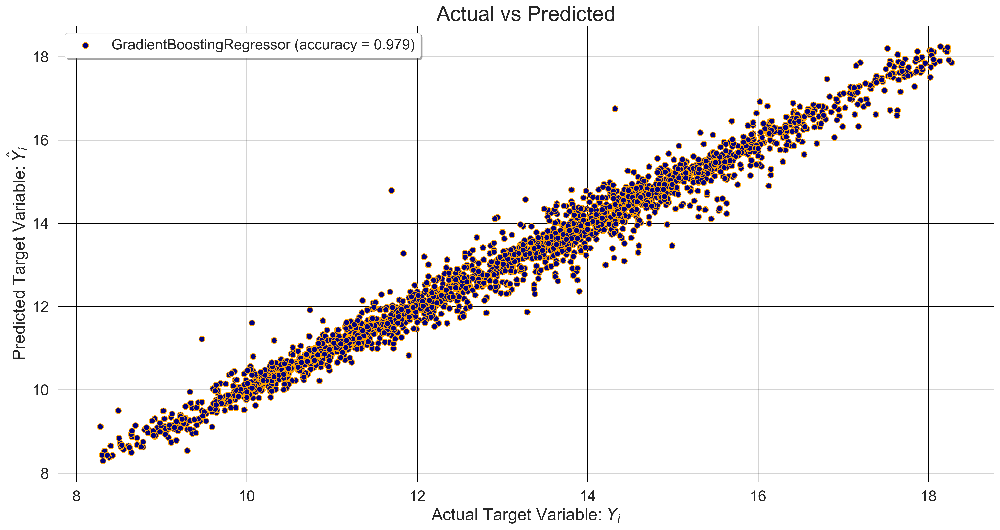

,mean_squared_error,root_mean_sqaured_error,r2_score,explained_variance_score,mean_absolute_error,median_absolute_error,mean_sqaured_log_error
0,0.09961,0.31561,0.979397,0.97944,0.208896,0.136216,0.000499


In [19]:
best_estimator = grid.best_estimator_

helper.evaluate(
        X_test, 
        y_test, 
        model_name="GradientBoostingRegressor", 
        model=best_estimator, 
        save=True, 
        title_fontsize=25, 
        xlabel_fontsize=20, 
        ylabel_fontsize=20, 
        xticks_fontsize=18, 
        yticks_fontsize=18,
        transparent=True, 
        dpi=300, 
        figsize=(20, 10), 
        facecolor='navy', 
        edgecolor='orange'
)

### Predicting with the Best Estimator and Saving Predicted Results as `csv`

In [20]:
tune_y_pred = best_estimator.predict(X_test)

hyp_tune_data = pd.DataFrame(
    {"generation": list(y_test), "predicted_generation": list(tune_y_pred),}
)

hyp_tune_data.to_csv("tune_model_predicted_values.csv", index=True)

hyp_tune_data.head(10)

,generation,predicted_generation
0,17.596,17.762139
1,15.630,15.340656
2,10.850,11.217904
3,14.520,14.539913
4,8.420,8.425648
5,13.640,14.221402
6,14.010,13.772766
7,9.699,9.761447
8,13.900,12.366367
9,11.150,10.936096


### Feature Importance

In [21]:
features = ['norminal_head', 'discharge']
importances = best_estimator.feature_importances_

feature_importance = pd.DataFrame({
    'feature': features,
    'importance': importances,
})

feature_importance.sort_values("importance", inplace=True, ascending=False)
feature_importance.to_csv("feature_importance.csv", index=True)
feature_importance

,feature,importance
1,discharge,0.584506
0,norminal_head,0.415494


### Plotting Feature Importance

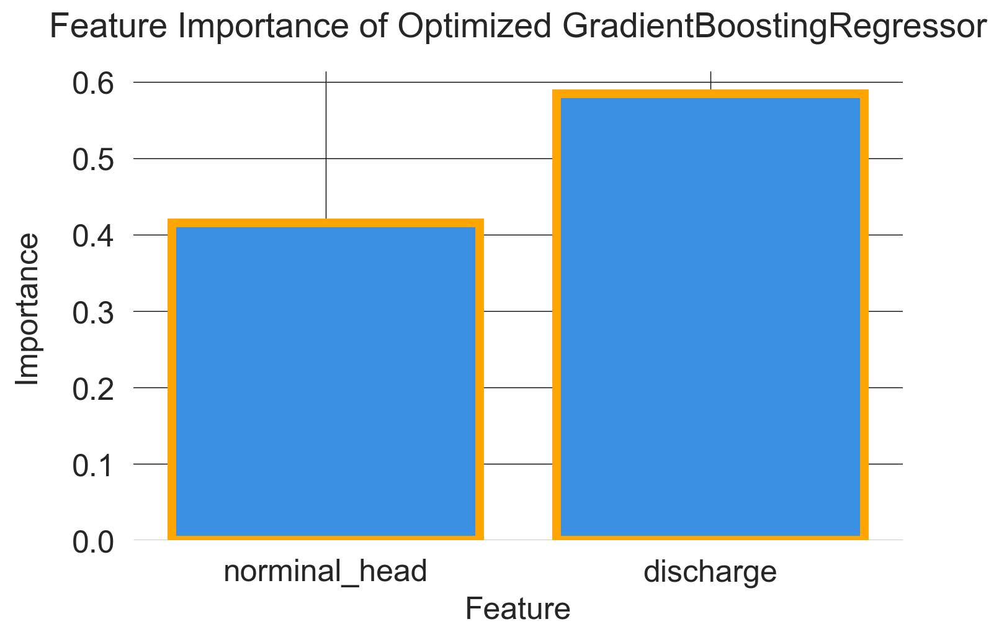

In [22]:
plt.figure(figsize=(8, 5), dpi=200)

sns.barplot(x=features, y=importances, color="dodgerblue", edgecolor="orange", linewidth=5)
plt.title("Feature Importance of Optimized GradientBoostingRegressor", size=20, pad=20)
plt.xlabel("Feature", fontsize=18, labelpad=5)
plt.ylabel("Importance", fontsize=18, labelpad=18)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.grid(b=True, which="both", axis="both", color="black", linewidth=0.5)

plt.savefig('feature_importance_GradientBoostingRegressor.png', dpi=300, transparent=True)

plt.show()

### Saving the Best Estimator with `joblib`

In [23]:
import joblib

joblib.dump(best_estimator, "GradientBoosting.joblib")

['GradientBoosting.joblib']

In [30]:
import pickle

# Saving model to disk
pickle.dump(best_estimator, open('model.pkl','wb'))

# Loading model to compare the results
model = pickle.load(open('model.pkl','rb'))

In [31]:
print(model.predict([[12, 9]]))

[17.38891152]
